In [201]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from PIL import Image
from scipy import stats
from skimage import filters

Dynamic Walking Video
------------------------------------------

In [308]:
vidcap = cv2.VideoCapture('denis_walk.avi')
success,image = vidcap.read()
count = 0
while success:
  cv2.imwrite("frames/dynamic/frame%d.jpg" % count, image)     # save frame as JPEG file      
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1

Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame

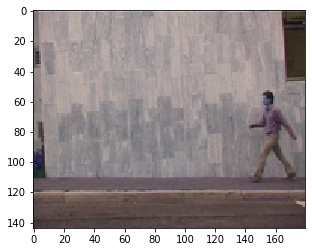

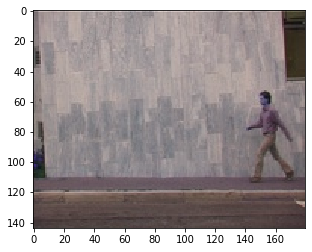

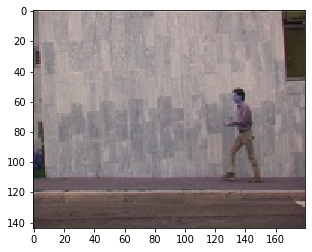

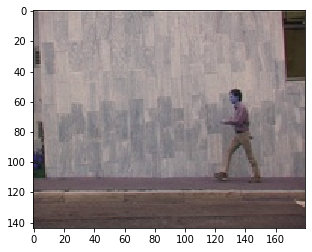

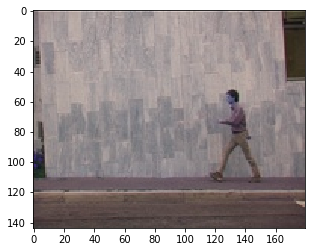

...

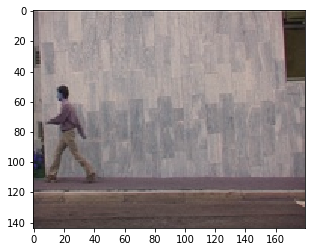

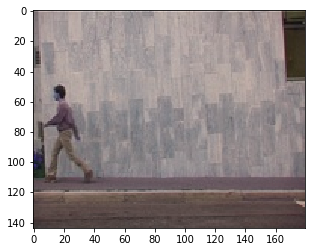

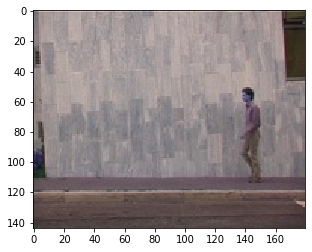

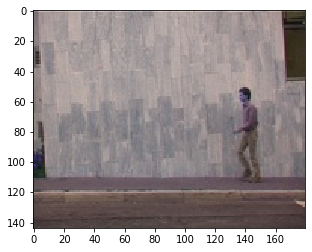

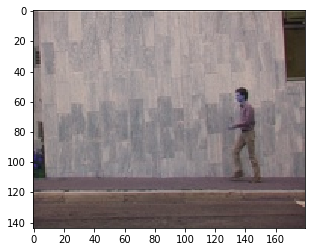

In [312]:
frames = []
for file in os.listdir("frames/dynamic"):
    image = cv2.imread("frames/dynamic/"+ file)
#     image.astype(float)
    frames.append(image)
    plt.imshow(image)
    plt.show()


In [186]:
def calculate_background(frames, method = "mean"):
    if(method == "mean"):
        mean = np.zeros(frames[0].shape)
        
        for frame in frames:
            mean = mean + frame

        mean = mean//len(frames)
        return mean
    elif(method == "median"):
        median = np.stack([f for f in frames])
        median = np.median(median, axis = 0)
        return median
    elif(method == "mode"):
        mode = np.stack([f for f in frames])
        mode = stats.mode(mode, axis = 0)
        mode = np.squeeze(mode[0])
        return mode
    else:
        raise Exception("Not a valid method")

In [187]:
mean = calculate_background(frames, "mean")
cv2.imwrite("bgsub/dynamic/backgound/mean_background.jpg",mean)     # save frame as JPEG file      

median = calculate_background(frames, "median")
cv2.imwrite("bgsub/dynamic/backgound/median_background.jpg",median)     # save frame as JPEG file   

mode = calculate_background(frames, "mode")
cv2.imwrite("bgsub/dynamic/backgound/mode_background.jpg",mode)     # save frame as JPEG file   

True

In [321]:
def background_subtraction( frames, method = "mean", loc = 0):
    
    if(method == "mean"):
        mean = calculate_background(frames, "mean")
#         if(loc == 0):
#             mean = cv2.imread("bgsub/dynamic/backgound/mean_background.jpg")
#         else:
#             mean = cv2.imread("bgsub/static/background/mean_background.jpg")
        count = 0
        for frame in frames:
            curr = abs(frame - mean)
            thres = np.mean(curr,2)
            val = filters.threshold_otsu(curr)
            thres[thres >= val] = 255
            thres[thres <val] = 0
            B = curr[:,:,0]
            G = curr[:,:,1]
            R = curr[:,:,2]
            B[thres == 255] = 255
            G[thres == 255] = 255
            R[thres == 255] = 0
            final_image =  np.dstack((R,G,B))
#             plt.imshow(G)
#             plt.show()
            if(loc == 0):
                cv2.imwrite("bgsub/dynamic/mean/frame%d.jpg" % count, final_image)
            else:
                cv2.imwrite("bgsub/static/mean/frame%d.jpg" % count, final_image)
            count = count + 1
    elif(method == "median"):
        median = calculate_background(frames, "median")
#         if(loc == 0):
#             median = cv2.imread("bgsub/dynamic/backgound/median_background.jpg")
#         else:
#             median = cv2.imread("bgsub/static/background/median_background.jpg")
        count = 0
        for frame in frames:
            curr = abs(frame - median)
            thres = np.mean(curr,2)
            val = filters.threshold_otsu(curr)
            thres[thres >= val] = 255
            thres[thres <val] = 0
            B = curr[:,:,0]
            G = curr[:,:,1]
            R = curr[:,:,2]
            B[thres == 255] = 255
            G[thres == 255] = 255
            R[thres == 255] = 0
            final_image =  np.dstack((R,G,B))
            if(loc == 0):
                cv2.imwrite("bgsub/dynamic/median/frame%d.jpg" % count, final_image)
            else:
                cv2.imwrite("bgsub/static/median/frame%d.jpg" % count, final_image)
            count = count + 1
            
    elif(method == "mode"):
        mode = calculate_background(frames, "mode")
#         if(loc == 0):
#             mode = cv2.imread("bgsub/dynamic/backgound/mode_background.jpg")
#         else:
#             mode = cv2.imread("bgsub/static/background/mode_background.jpg")
        count = 0
        for frame in frames:
            curr = abs(frame - mode)
            thres = np.mean(curr,2)
            val = filters.threshold_otsu(curr)
            thres[thres >= val] = 255
            thres[thres <val] = 0
            B = curr[:,:,0]
            G = curr[:,:,1]
            R = curr[:,:,2]
            B[thres == 255] = 255
            G[thres == 255] = 255
            R[thres == 255] = 0
            final_image =  np.dstack((R,G,B))
            if(loc == 0):
                cv2.imwrite("bgsub/dynamic/mode/frame%d.jpg" % count, final_image)
            else:
                cv2.imwrite("bgsub/static/mode/frame%d.jpg" % count, final_image)
            count = count + 1
    else:
        raise Exception("Not a valid method")
    

In [322]:
background_subtraction(frames, "mean")
background_subtraction(frames, "median")
background_subtraction(frames, "mode")

Static Video 
-----------------

In [295]:
vidcap = cv2.VideoCapture('camera_lens_spinning_2.mp4')
success,image = vidcap.read()
count = 0
while success:
  cv2.imwrite("frames/static/frame%d.jpg" % count, image)     # save frame as JPEG file      
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1

Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame

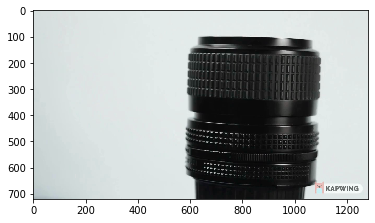

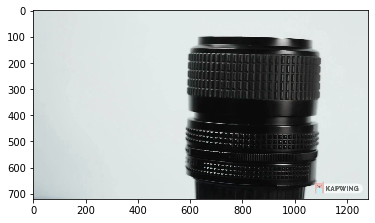

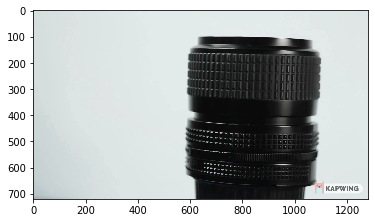

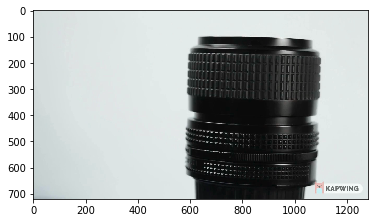

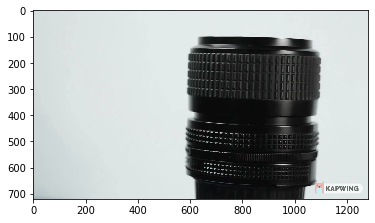

...

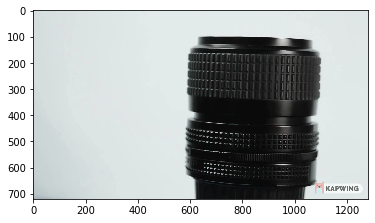

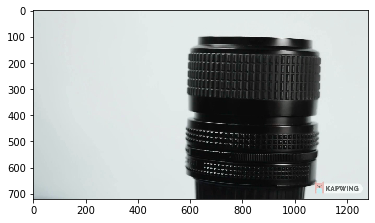

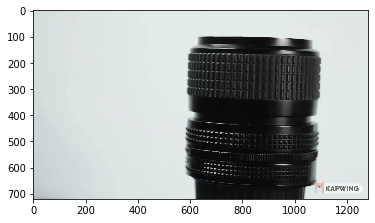

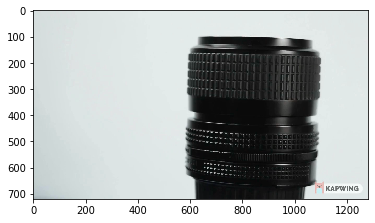

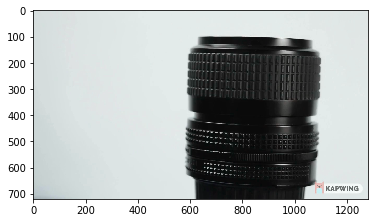

In [296]:
frames = []
for file in os.listdir("frames/static"):
    image = cv2.imread("frames/static/"+ file)
#     image.astype(float)
    frames.append(image)
    plt.imshow(image)
    plt.show()


In [300]:
mean = calculate_background(frames, "mean")
cv2.imwrite("bgsub/static/background/mean_background.jpg",mean)     # save frame as JPEG file      

median = calculate_background(frames, "median")
cv2.imwrite("bgsub/static/background/median_background.jpg",median)     # save frame as JPEG file   

mode = calculate_background(frames, "mode")
cv2.imwrite("bgsub/static/background/mode_background.jpg",mode)     # save frame as JPEG file   

True

In [306]:
background_subtraction(frames, "mean", 1)
background_subtraction(frames, "median",1)
background_subtraction(frames, "mode",1)